0. Environment Setup

In [1]:
# O.1. Download packages
#!pip install librosa numpy soundfile matplotlib -q

In [2]:
# 0.2. Load requested libraries
import librosa
import IPython.display as ipd
import soundfile as sf
import numpy as np 
import matplotlib.pyplot as plt
import speech_recognition as speech_rec  
import os
import tempfile

from matplotlib.colors import LinearSegmentedColormap
from faster_whisper import WhisperModel

c:\Users\Visiteur\Desktop\Julien\Privacy\13-GitHub Projects\Speech-Transcription\venvAudioProcessing\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# 0.3. Load and Read audio file
# --Load the audio file
file_opus_path = "./Data Audio/speech1.opus"

# Listen to the audio
ipd.display(ipd.Audio(file_opus_path))   

In [4]:
# Convert the audio '.opus' file to '.mp3' file

output_file_path = "./Data Audio/speech1.mp3"
audio_opus, sr = librosa.load(file_opus_path, sr=None, mono=True)
sf.write(output_file_path, audio_opus, sr, format='MP3')

In [5]:
# Listen to the converted audio file
file_mp3_path = output_file_path
ipd.display(ipd.Audio(file_mp3_path))

In [6]:
# --Read the audio file
audio, sr = librosa.load(file_mp3_path, sr=None)

1. Audio Processing

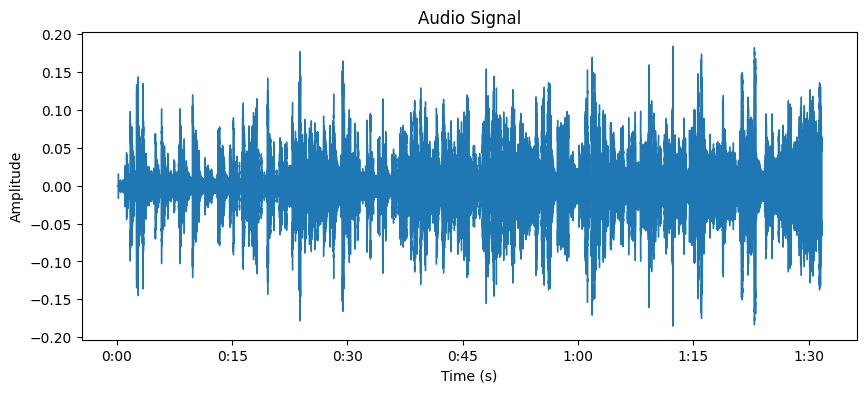

In [7]:
# 2. Audio Processing
# 2.1. Display the Audio Signal 
plt.figure(figsize=(10, 4))
librosa.display.waveshow(audio, sr=sr)
plt.title("Audio Signal")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude") 
plt.show()

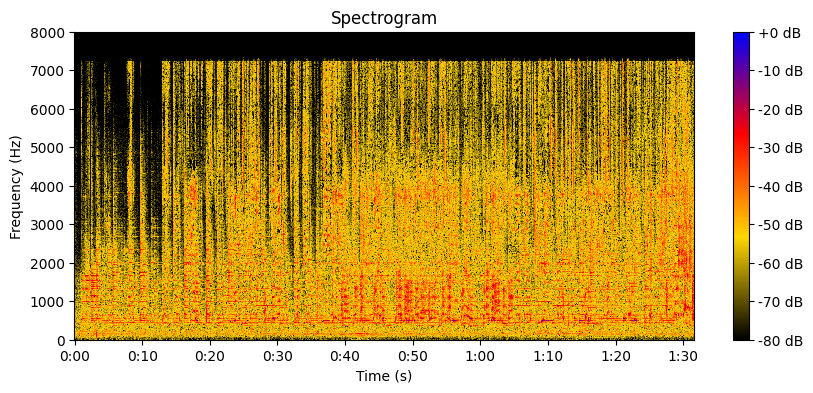

In [8]:
# 2.2. Display the Audio Spectrogram
# -- Créer une carte de couleurs personnalisée
colors = ["black", "gold", "red", "blue"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

# -- Display the spectrogram
D = librosa.amplitude_to_db(np.abs(librosa.stft(audio)), ref=np.max)
plt.figure(figsize=(10, 4))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='linear', cmap=cmap)
plt.title("Spectrogram")
plt.colorbar(format='%+2.0f dB')
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.show()


1.1. Noise Reduction

In [9]:
# Remove the first 12 seconds (assumed noise) from the audio
noise_duration_sec = 12
start_sample = int(noise_duration_sec * sr)
audio_denoised = audio[start_sample:]

# Listen to the denoised audio
ipd.display(ipd.Audio(audio_denoised, rate=sr))

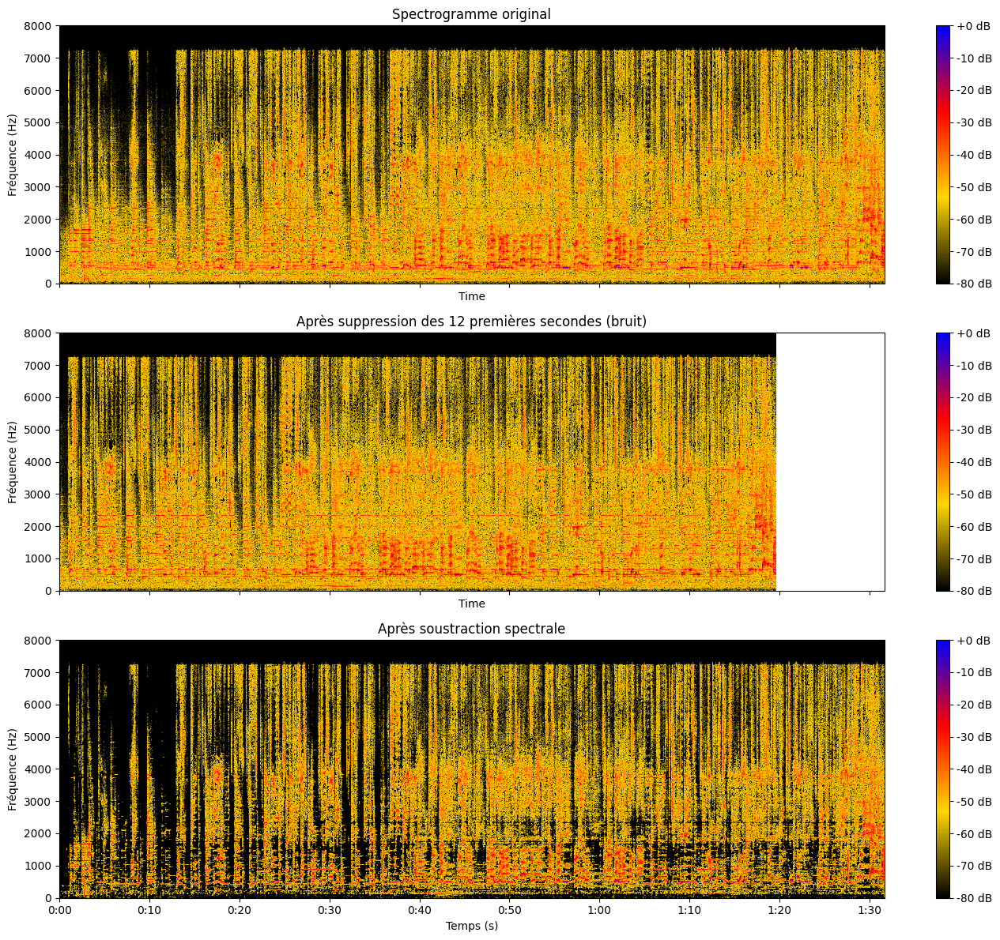

In [10]:
# Drop the first 12 seconds of audio considered as noise and apply spectral subtraction
audio_denoised = audio[start_sample:]

# Spectral Subtraction: Estimate the noise and subtract it from the 12 seconds of audio
noise_sample = audio[:start_sample]
noise_stft = librosa.stft(noise_sample)
mean_noise_mag = np.mean(np.abs(noise_stft), axis=1, keepdims=True)

audio_stft = librosa.stft(audio)
audio_mag, audio_phase = np.abs(audio_stft), np.angle(audio_stft)
audio_mag_denoised = np.maximum(audio_mag - mean_noise_mag, 0.0)
audio_stft_denoised = audio_mag_denoised * np.exp(1j * audio_phase)
audio_spectral_denoised = librosa.istft(audio_stft_denoised)

# Display the original and denoised audio spectrograms
D_original = librosa.amplitude_to_db(np.abs(librosa.stft(audio)), ref=np.max)
D_denoised = librosa.amplitude_to_db(np.abs(librosa.stft(audio_denoised)), ref=np.max)
D_spectral_denoised = librosa.amplitude_to_db(np.abs(librosa.stft(audio_spectral_denoised)), ref=np.max)

fig, axs = plt.subplots(3, 1, figsize=(14, 12), sharex=True)

# Original spectrogram
img1 = librosa.display.specshow(D_original, sr=sr, x_axis='time', y_axis='linear', cmap=cmap, ax=axs[0])
axs[0].set_title("Spectrogramme original")
axs[0].set_ylabel("Fréquence (Hz)")
fig.colorbar(img1, ax=axs[0], format='%+2.0f dB')

# Spectrogram after removing the first 12 seconds (assumed noise)
img2 = librosa.display.specshow(D_denoised, sr=sr, x_axis='time', y_axis='linear', cmap=cmap, ax=axs[1])
axs[1].set_title("Après suppression des 12 premières secondes (bruit)")
axs[1].set_ylabel("Fréquence (Hz)")
fig.colorbar(img2, ax=axs[1], format='%+2.0f dB')

# Spectrogram after spectral subtraction
img3 = librosa.display.specshow(D_spectral_denoised, sr=sr, x_axis='time', y_axis='linear', cmap=cmap, ax=axs[2])
axs[2].set_title("Après soustraction spectrale")
axs[2].set_xlabel("Temps (s)")
axs[2].set_ylabel("Fréquence (Hz)")
fig.colorbar(img3, ax=axs[2], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# Listen to the denoised audio after spectral subtraction
ipd.display(ipd.Audio(audio_spectral_denoised, rate=sr))

2. Speech Transcription

In [11]:
# Approach 1: Transcribe the denoised audio using Google Speech Recognition API

# Save the denoised audio to a temporary WAV file
with tempfile.NamedTemporaryFile(suffix=".wav", delete=False) as tmp_wav:
    sf.write(tmp_wav.name, audio_spectral_denoised, sr)  
    tmp_wav_path = tmp_wav.name

# Initialize recognizer
recognizer = speech_rec.Recognizer()

# Load and transcribe the temporary audio file
with speech_rec.AudioFile(tmp_wav_path) as source:
    audio_data = recognizer.record(source)
    try:
        # Use Google's free web API for transcription
        transcription = recognizer.recognize_google(audio_data, language='en-US')
        print("Transcription:")
        print(transcription)
    except speech_rec.UnknownValueError:
        transcription = ""
        print("Google Speech Recognition could not understand the audio.")
    except speech_rec.RequestError as e:
        transcription = ""
        print(f"Could not request results from Google Speech Recognition service; {e}")

# Clean up the temporary file
os.remove(tmp_wav_path)


Google Speech Recognition could not understand the audio.


In [12]:
# Approach 2: Transcribe the denoised audio using Whisper ASR

# Save the denoised audio to a temporary WAV file
with tempfile.NamedTemporaryFile(suffix=".wav", delete=False) as tmp_wav:
    sf.write(tmp_wav.name, audio_spectral_denoised, sr)
    tmp_wav_path = tmp_wav.name

# Load the Whisper model (base)
model = WhisperModel("base")

# Transcribe the audio
segments, info = model.transcribe(tmp_wav_path, language="en")

# Store the transcription in a variable
full_transcription = ""
for segment in segments:
    full_transcription += segment.text + " "

# Display the transcription
print("Transcription:")
print(full_transcription.strip())

# Clean up the temporary file
os.remove(tmp_wav_path)


Transcription:
I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  I'm  It all stays in the air just to be fun.


In [13]:
# NEXT STEPS:
"""
TODO: 
    - Listen to the audio & Identify noise and their locations
    - Apply noise reduction techniques
    - Visualize the noise reduction effect i.e. before and after noise reduction => Look at their spectrograms
    - Apply speech transcription techniques
    - Visualize the output of the speech transcription
"""

'\nTODO: \n    - Listen to the audio & Identify noise and their locations\n    - Apply noise reduction techniques\n    - Visualize the noise reduction effect i.e. before and after noise reduction => Look at their spectrograms\n    - Apply speech transcription techniques\n    - Visualize the output of the speech transcription\n'